## Real_Estate_pred

In [4]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib 
matplotlib.rcParams["figure.figsize"] = (20,10)
from collections import Counter

In [5]:
df = pd.read_csv("estate_prices.csv")
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [7]:
df.describe()

,bath,balcony,price
count,13247.000000,12711.000000,13320.000000
mean,2.692610,1.584376,112.565627
std,1.341458,0.817263,148.971674
min,1.000000,0.000000,8.000000
25%,2.000000,1.000000,50.000000
50%,2.000000,2.000000,72.000000
75%,3.000000,2.000000,120.000000
max,40.000000,3.000000,3600.000000


In [8]:
df.shape

(13320, 9)

In [9]:
df.columns

Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price'],
      dtype='object')

In [10]:
df['area_type'].unique()

array(['Super built-up  Area', 'Plot  Area', 'Built-up  Area',
       'Carpet  Area'], dtype=object)

In [11]:
##New
df['location'].describe()

count          13319
unique          1305
top       Whitefield
freq             540
Name: location, dtype: object

In [12]:
df['location'].unique()

array(['Electronic City Phase II', 'Chikka Tirupathi', 'Uttarahalli', ...,
       '12th cross srinivas nagar banshankari 3rd stage',
       'Havanur extension', 'Abshot Layout'], dtype=object)

In [13]:
df['area_type'].value_counts()

Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: area_type, dtype: int64

In [14]:
df['location'].value_counts()

Whitefield                        540
Sarjapur  Road                    399
Electronic City                   302
Kanakpura Road                    273
Thanisandra                       234
                                 ... 
Bapuji Layout                       1
1st Stage Radha Krishna Layout      1
BEML Layout 5th stage               1
singapura paradise                  1
Abshot Layout                       1
Name: location, Length: 1305, dtype: int64

In [15]:
from sklearn.preprocessing import LabelEncoder

# Label encoding
label_encoder = LabelEncoder()
df['area_typeEncoded'] = label_encoder.fit_transform(df['area_type'])

# Print the encoded data
print(df)

                  area_type   availability                  location  \
0      Super built-up  Area         19-Dec  Electronic City Phase II   
1                Plot  Area  Ready To Move          Chikka Tirupathi   
2            Built-up  Area  Ready To Move               Uttarahalli   
3      Super built-up  Area  Ready To Move        Lingadheeranahalli   
4      Super built-up  Area  Ready To Move                  Kothanur   
...                     ...            ...                       ...   
13315        Built-up  Area  Ready To Move                Whitefield   
13316  Super built-up  Area  Ready To Move             Richards Town   
13317        Built-up  Area  Ready To Move     Raja Rajeshwari Nagar   
13318  Super built-up  Area         18-Jun           Padmanabhanagar   
13319  Super built-up  Area  Ready To Move              Doddathoguru   

            size  society total_sqft  bath  balcony   price  area_typeEncoded  
0          2 BHK  Coomee        1056   2.0      1.0   3

In [16]:
df

,area_type,availability,location,size,society,total_sqft,bath,balcony,price,area_typeEncoded
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07,3
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00,2
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00,0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00,3
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00,3
...,...,...,...,...,...,...,...,...,...,...
13315,Built-up Area,Ready To Move,Whitefield,5 Bedroom,ArsiaEx,3453,4.0,0.0,231.00,0
13316,Super built-up Area,Ready To Move,Richards Town,4 BHK,NaN,3600,5.0,NaN,400.00,3
13317,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,Mahla T,1141,2.0,1.0,60.00,0
13318,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,SollyCl,4689,4.0,1.0,488.00,3


In [17]:
df1 = df.drop(['area_type','society','availability'],axis='columns')

In [18]:
df1

,location,size,total_sqft,bath,balcony,price,area_typeEncoded
0,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,3
1,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2
2,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,0
3,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,1.0,51.00,3
...,...,...,...,...,...,...,...
13315,Whitefield,5 Bedroom,3453,4.0,0.0,231.00,0
13316,Richards Town,4 BHK,3600,5.0,NaN,400.00,3
13317,Raja Rajeshwari Nagar,2 BHK,1141,2.0,1.0,60.00,0
13318,Padmanabhanagar,4 BHK,4689,4.0,1.0,488.00,3


In [19]:
df['area_typeEncoded'].unique()

array([3, 2, 0, 1])

## Data Cleaning / handling null val

In [20]:
df1.isnull().sum()

location              1
size                 16
total_sqft            0
bath                 73
balcony             609
price                 0
area_typeEncoded      0
dtype: int64

In [21]:
df2 = df1.dropna()
df2.isnull().sum()

location            0
size                0
total_sqft          0
bath                0
balcony             0
price               0
area_typeEncoded    0
dtype: int64

In [22]:
df2.shape

(12710, 7)

In [23]:
df2

,location,size,total_sqft,bath,balcony,price,area_typeEncoded
0,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,3
1,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2
2,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,0
3,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,1.0,51.00,3
...,...,...,...,...,...,...,...
13314,Green Glen Layout,3 BHK,1715,3.0,3.0,112.00,3
13315,Whitefield,5 Bedroom,3453,4.0,0.0,231.00,0
13317,Raja Rajeshwari Nagar,2 BHK,1141,2.0,1.0,60.00,0
13318,Padmanabhanagar,4 BHK,4689,4.0,1.0,488.00,3


## Feature Engineering

In [24]:
## eliminate string 
df2['bhk'] = df2['size'].apply(lambda x: int(x.split(' ')[0]))
df2.bhk.unique()

C:\Users\richardgr\AppData\Local\Temp\ipykernel_10512\1128637108.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['bhk'] = df2['size'].apply(lambda x: int(x.split(' ')[0]))


array([ 2,  4,  3,  1,  6,  8,  7,  5, 11,  9, 27, 43, 14, 12, 10, 13],
      dtype=int64)

In [25]:
df2

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07,3,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00,2,4
2,Uttarahalli,3 BHK,1440,2.0,3.0,62.00,0,3
3,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00,3,3
4,Kothanur,2 BHK,1200,2.0,1.0,51.00,3,2
...,...,...,...,...,...,...,...,...
13314,Green Glen Layout,3 BHK,1715,3.0,3.0,112.00,3,3
13315,Whitefield,5 Bedroom,3453,4.0,0.0,231.00,0,5
13317,Raja Rajeshwari Nagar,2 BHK,1141,2.0,1.0,60.00,0,2
13318,Padmanabhanagar,4 BHK,4689,4.0,1.0,488.00,3,4


In [26]:
df2.drop(['size'],axis='columns')

,location,total_sqft,bath,balcony,price,area_typeEncoded,bhk
0,Electronic City Phase II,1056,2.0,1.0,39.07,3,2
1,Chikka Tirupathi,2600,5.0,3.0,120.00,2,4
2,Uttarahalli,1440,2.0,3.0,62.00,0,3
3,Lingadheeranahalli,1521,3.0,1.0,95.00,3,3
4,Kothanur,1200,2.0,1.0,51.00,3,2
...,...,...,...,...,...,...,...
13314,Green Glen Layout,1715,3.0,3.0,112.00,3,3
13315,Whitefield,3453,4.0,0.0,231.00,0,5
13317,Raja Rajeshwari Nagar,1141,2.0,1.0,60.00,0,2
13318,Padmanabhanagar,4689,4.0,1.0,488.00,3,4


In [27]:
df2[df2.bhk > 20] 

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk
1718,2Electronic City Phase II,27 BHK,8000,27.0,0.0,230.0,3,27
4684,Munnekollal,43 Bedroom,2400,40.0,0.0,660.0,2,43


In [28]:
df2.total_sqft.unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

In [29]:
## to convert data range 
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True

In [30]:
## negate will return df with all range val data
df2[~df2['total_sqft'].apply(is_float)].head(10)

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk
30,Yelahanka,4 BHK,2100 - 2850,4.0,0.0,186.000,3,4
122,Hebbal,4 BHK,3067 - 8156,4.0,0.0,477.000,3,4
137,8th Phase JP Nagar,2 BHK,1042 - 1105,2.0,0.0,54.005,3,2
165,Sarjapur,2 BHK,1145 - 1340,2.0,0.0,43.490,3,2
188,KR Puram,2 BHK,1015 - 1540,2.0,0.0,56.800,3,2
410,Kengeri,1 BHK,34.46Sq. Meter,1.0,0.0,18.500,3,1
549,Hennur Road,2 BHK,1195 - 1440,2.0,0.0,63.770,3,2
661,Yelahanka,2 BHK,1120 - 1145,2.0,0.0,48.130,3,2
672,Bettahalsoor,4 Bedroom,3090 - 5002,4.0,0.0,445.000,0,4
772,Banashankari Stage VI,2 BHK,1160 - 1195,2.0,0.0,59.935,3,2


In [31]:
##Above shows that total_sqft can be a range (e.g. 2100-2850). For such case we can just take average of min and max value in the range.** 

In [32]:
def convert_sqft_to_num(x):
    tokens = x.split('-')
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None   

In [33]:
convert_sqft_to_num('100-50')

75.0

In [34]:
df2.total_sqft = df.total_sqft.apply(convert_sqft_to_num)
df2.head(2)

C:\Users\richardgr\AppData\Local\Temp\ipykernel_10512\3097554064.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.total_sqft = df.total_sqft.apply(convert_sqft_to_num)


,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,1.0,39.07,3,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,3.0,120.00,2,4


In [35]:
df2

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,1.0,39.07,3,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,3.0,120.00,2,4
2,Uttarahalli,3 BHK,1440.0,2.0,3.0,62.00,0,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,1.0,95.00,3,3
4,Kothanur,2 BHK,1200.0,2.0,1.0,51.00,3,2
...,...,...,...,...,...,...,...,...
13314,Green Glen Layout,3 BHK,1715.0,3.0,3.0,112.00,3,3
13315,Whitefield,5 Bedroom,3453.0,4.0,0.0,231.00,0,5
13317,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,1.0,60.00,0,2
13318,Padmanabhanagar,4 BHK,4689.0,4.0,1.0,488.00,3,4


In [36]:
## location using index
df2.loc[30]

location            Yelahanka
size                    4 BHK
total_sqft             2475.0
bath                      4.0
balcony                   0.0
price                   186.0
area_typeEncoded            3
bhk                         4
Name: 30, dtype: object

**Add new feature called price per square feet**

In [37]:
df3 = df2.copy()
df3['price_per_sqft'] = df3['price']*100000/df3['total_sqft']
df3.head()

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,1.0,39.07,3,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,3.0,120.00,2,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,3.0,62.00,0,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,1.0,95.00,3,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,1.0,51.00,3,2,4250.000000


In [38]:
df3['price_per_sqft'].describe()

count    1.266800e+04
mean     6.876277e+03
std      2.263354e+04
min      2.678298e+02
25%      4.242721e+03
50%      5.376344e+03
75%      7.142857e+03
max      2.300000e+06
Name: price_per_sqft, dtype: float64

**Examine locations which is a categorical variable. We need to apply dimensionality reduction technique here to reduce number of locations**

In [39]:
len(df3.location.unique())

1265

In [40]:
##strip to remove leading space
df3.location = df3.location.apply(lambda x: x.strip())
location_stats = df3.groupby('location')['location'].agg('count').sort_values(ascending=False)  
location_stats

location
Whitefield              515
Sarjapur  Road          372
Electronic City         302
Kanakpura Road          261
Thanisandra             234
                       ... 
Kanakapura  Rod           1
Kanakapura Main Road      1
Kanakapura Road           1
Kanakapura Road,          1
whitefiled                1
Name: location, Length: 1254, dtype: int64

In [41]:
##Alternative head can also be used
loc_count = df3['location'].value_counts(ascending=False)
loc_count

Whitefield          515
Sarjapur  Road      372
Electronic City     302
Kanakpura Road      261
Thanisandra         234
                   ... 
Shirdi Sai Nagar      1
S R Layout            1
Meenakshi Layout      1
Vidyapeeta            1
Abshot Layout         1
Name: location, Length: 1254, dtype: int64

**Display all rows of the DataFrame**

In [42]:
##Display all rows of the DataFrame
pd.set_option('display.max_rows', None)
print(df3.to_string())

                                                 location        size  total_sqft  bath  balcony     price  area_typeEncoded  bhk  price_per_sqft
0                                Electronic City Phase II       2 BHK    1056.000   2.0      1.0    39.070                 3    2    3.699811e+03
1                                        Chikka Tirupathi   4 Bedroom    2600.000   5.0      3.0   120.000                 2    4    4.615385e+03
2                                             Uttarahalli       3 BHK    1440.000   2.0      3.0    62.000                 0    3    4.305556e+03
3                                      Lingadheeranahalli       3 BHK    1521.000   3.0      1.0    95.000                 3    3    6.245891e+03
4                                                Kothanur       2 BHK    1200.000   2.0      1.0    51.000                 3    2    4.250000e+03
5                                              Whitefield       2 BHK    1170.000   2.0      1.0    38.000                 3

In [43]:
##example
df3

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.000,2.0,1.0,39.070,3,2,3.699811e+03
1,Chikka Tirupathi,4 Bedroom,2600.000,5.0,3.0,120.000,2,4,4.615385e+03
2,Uttarahalli,3 BHK,1440.000,2.0,3.0,62.000,0,3,4.305556e+03
3,Lingadheeranahalli,3 BHK,1521.000,3.0,1.0,95.000,3,3,6.245891e+03
4,Kothanur,2 BHK,1200.000,2.0,1.0,51.000,3,2,4.250000e+03
5,Whitefield,2 BHK,1170.000,2.0,1.0,38.000,3,2,3.247863e+03
8,Marathahalli,3 BHK,1310.000,3.0,1.0,63.250,3,3,4.828244e+03
10,Whitefield,3 BHK,1800.000,2.0,2.0,70.000,3,3,3.888889e+03
11,Whitefield,4 Bedroom,2785.000,5.0,3.0,295.000,2,4,1.059246e+04
12,7th Phase JP Nagar,2 BHK,1000.000,2.0,1.0,38.000,3,2,3.800000e+03


In [44]:
##To increase display row
df10 = pd.set_option('display.max_rows', 1300)
print(df3.to_string())

                                                 location        size  total_sqft  bath  balcony     price  area_typeEncoded  bhk  price_per_sqft
0                                Electronic City Phase II       2 BHK    1056.000   2.0      1.0    39.070                 3    2    3.699811e+03
1                                        Chikka Tirupathi   4 Bedroom    2600.000   5.0      3.0   120.000                 2    4    4.615385e+03
2                                             Uttarahalli       3 BHK    1440.000   2.0      3.0    62.000                 0    3    4.305556e+03
3                                      Lingadheeranahalli       3 BHK    1521.000   3.0      1.0    95.000                 3    3    6.245891e+03
4                                                Kothanur       2 BHK    1200.000   2.0      1.0    51.000                 3    2    4.250000e+03
5                                              Whitefield       2 BHK    1170.000   2.0      1.0    38.000                 3

In [45]:
location_stats.values.sum()

12710

In [46]:
len(location_stats)

1254

In [47]:
location_stats[location_stats>10]

location
Whitefield                     515
Sarjapur  Road                 372
Electronic City                302
Kanakpura Road                 261
Thanisandra                    234
Yelahanka                      206
Uttarahalli                    186
Hebbal                         173
Raja Rajeshwari Nagar          168
Marathahalli                   164
7th Phase JP Nagar             147
Bannerghatta Road              144
Hennur Road                    142
Haralur Road                   135
Electronic City Phase II       130
Rajaji Nagar                    99
Chandapura                      98
Bellandur                       91
Electronics City Phase 1        86
Hoodi                           86
KR Puram                        85
Begur Road                      83
Sarjapur                        81
Yeshwanthpur                    78
Kasavanhalli                    77
Harlur                          76
Banashankari                    74
Ramamurthy Nagar                72
Hosa Road  

In [48]:
len(location_stats[location_stats>10])

237

In [49]:
len(location_stats[location_stats<=10])

1017

In [50]:
##dimesionality reduction

In [51]:
location_less_10 = location_stats[location_stats<=10]
location_less_10

location
1st Block Koramangala                                 10
Kalkere                                               10
Basapura                                              10
Kodigehalli                                           10
Gunjur Palya                                          10
HAL 2nd Stage                                         10
Ganga Nagar                                           10
Dairy Circle                                          10
Naganathapura                                         10
Nagappa Reddy Layout                                  10
Chandra Layout                                         9
Nehru Nagar                                            9
Kamakshipalya                                          9
B Narayanapura                                         9
Nagadevanahalli                                        9
Chennammana Kere                                       9
Dodsworth Layout                                       9
Kaverappa Layout      

In [52]:
len(df3['location'].unique())

1254

In [53]:
df3.location = df3.location.apply(lambda x: 'other' if x in location_less_10 else x)
len(df3.location.unique())

238

## find value with "other"

In [54]:
df3[df3.location=="other"]

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
18,other,3 BHK,2770.0,4.0,2.0,290.00,3,3,10469.314079
19,other,2 BHK,1100.0,2.0,2.0,48.00,3,2,4363.636364
25,other,3 BHK,1250.0,3.0,2.0,56.00,3,3,4480.000000
42,other,1 BHK,600.0,1.0,0.0,38.00,3,1,6333.333333
49,other,2 BHK,869.0,2.0,1.0,36.00,0,2,4142.692750
...,...,...,...,...,...,...,...,...,...
13278,other,2 BHK,1256.0,2.0,1.0,65.00,0,2,5175.159236
13285,other,2 BHK,1353.0,2.0,2.0,110.00,3,2,8130.081301
13291,other,1 Bedroom,812.0,1.0,0.0,26.00,2,1,3201.970443
13292,other,3 BHK,1440.0,2.0,2.0,63.93,3,3,4439.583333


In [55]:
len(df3.location=="other")

12710

In [56]:
df3

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,1.0,39.07,3,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,3.0,120.00,2,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,3.0,62.00,0,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,1.0,95.00,3,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,1.0,51.00,3,2,4250.000000
...,...,...,...,...,...,...,...,...,...
13314,Green Glen Layout,3 BHK,1715.0,3.0,3.0,112.00,3,3,6530.612245
13315,Whitefield,5 Bedroom,3453.0,4.0,0.0,231.00,0,5,6689.834926
13317,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,1.0,60.00,0,2,5258.545136
13318,Padmanabhanagar,4 BHK,4689.0,4.0,1.0,488.00,3,4,10407.336319


## outlier removal using Logic - 300 sq / bhk

In [57]:
df3[df3.total_sqft/df3.bhk<300].head()

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
58,Murugeshpalya,6 Bedroom,1407.0,4.0,1.0,150.0,2,6,10660.980810
68,Devarachikkanahalli,8 Bedroom,1350.0,7.0,0.0,85.0,2,8,6296.296296
70,other,3 Bedroom,500.0,3.0,2.0,100.0,2,3,20000.000000
78,Kaval Byrasandra,2 BHK,460.0,1.0,0.0,22.0,0,2,4782.608696
89,Rajaji Nagar,6 Bedroom,710.0,6.0,3.0,160.0,2,6,22535.211268


In [58]:
df3.shape

(12710, 9)

In [59]:
## ~ for filtering/removal
df4 = df3[~(df3.total_sqft/df3.bhk<300)]
df4.shape

(12055, 9)

In [60]:
df4

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,1.0,39.07,3,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,3.0,120.00,2,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,3.0,62.00,0,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,1.0,95.00,3,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,1.0,51.00,3,2,4250.000000
...,...,...,...,...,...,...,...,...,...
13314,Green Glen Layout,3 BHK,1715.0,3.0,3.0,112.00,3,3,6530.612245
13315,Whitefield,5 Bedroom,3453.0,4.0,0.0,231.00,0,5,6689.834926
13317,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,1.0,60.00,0,2,5258.545136
13318,Padmanabhanagar,4 BHK,4689.0,4.0,1.0,488.00,3,4,10407.336319


In [61]:
df4.price_per_sqft.describe()

count     12013.000000
mean       6206.082347
std        3985.518807
min         267.829813
25%        4199.363057
50%        5252.525253
75%        6823.529412
max      176470.588235
Name: price_per_sqft, dtype: float64

**Here we find that min price per sqft is 267 rs/sqft whereas max is 17600000, this shows a wide variation in property prices. We should remove outliers per location using mean and one standard deviation**

In [62]:
def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        reduced_df = subdf[(subdf.price_per_sqft>(m-st)) & (subdf.price_per_sqft<=(m+st))]
        df_out = pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
df5 = remove_pps_outliers(df4)
df5.shape

(9848, 9)

## Visualization

In [63]:
df5

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,1st Block Jayanagar,4 BHK,2850.0,4.0,1.0,428.00,3,4,15017.543860
1,1st Block Jayanagar,3 BHK,1630.0,3.0,2.0,194.00,3,3,11901.840491
2,1st Block Jayanagar,3 BHK,1875.0,2.0,3.0,235.00,3,3,12533.333333
3,1st Block Jayanagar,3 BHK,1200.0,2.0,0.0,130.00,0,3,10833.333333
4,1st Block Jayanagar,2 BHK,1235.0,2.0,2.0,148.00,3,2,11983.805668
...,...,...,...,...,...,...,...,...,...
9843,other,2 BHK,1256.0,2.0,1.0,65.00,0,2,5175.159236
9844,other,2 BHK,1353.0,2.0,2.0,110.00,3,2,8130.081301
9845,other,1 Bedroom,812.0,1.0,0.0,26.00,2,1,3201.970443
9846,other,3 BHK,1440.0,2.0,2.0,63.93,3,3,4439.583333


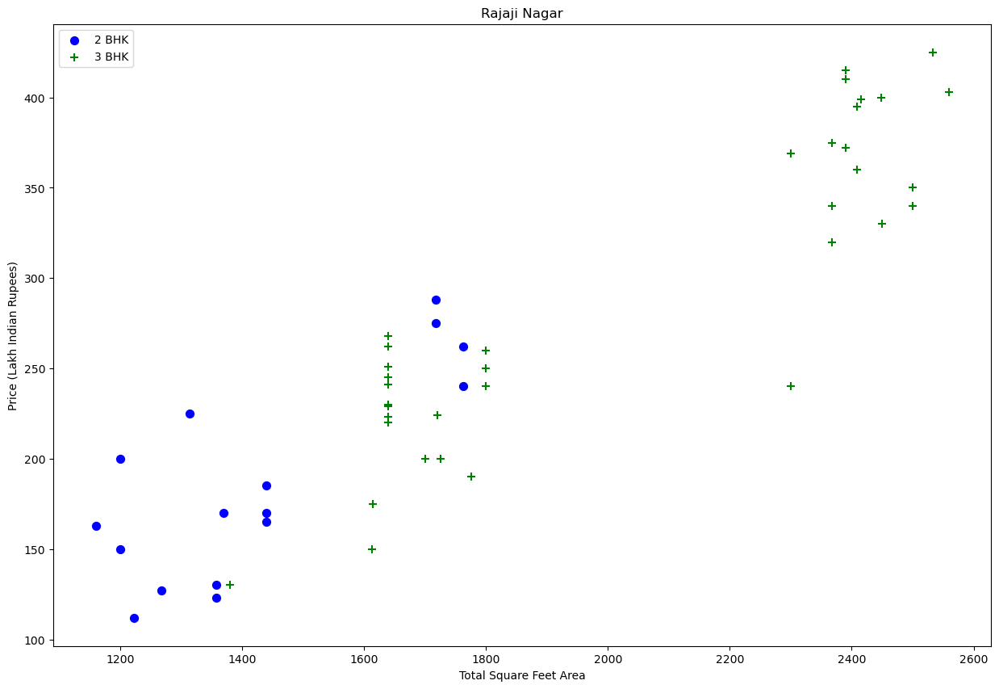

In [64]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.location==location) & (df.bhk==2)]
    bhk3 = df[(df.location==location) & (df.bhk==3)]
    matplotlib.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bhk2.total_sqft,bhk2.price,color='blue',label='2 BHK', s=50)
    plt.scatter(bhk3.total_sqft,bhk3.price,marker='+', color='green',label='3 BHK', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price (Lakh Indian Rupees)")
    plt.title(location)
    plt.legend()
    
plot_scatter_chart(df5,"Rajaji Nagar")

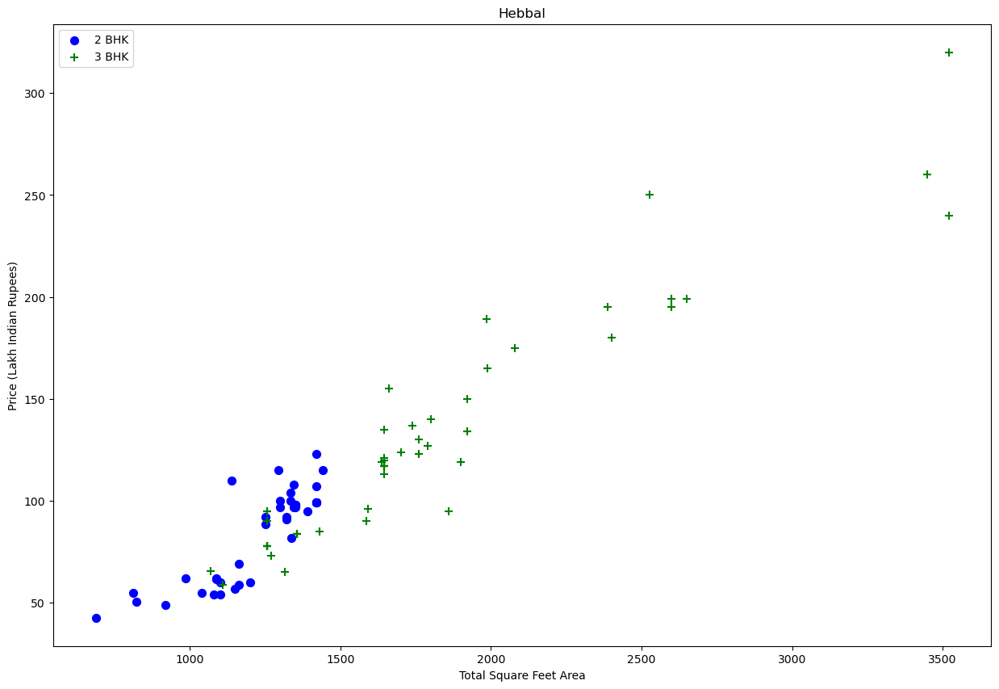

In [65]:
plot_scatter_chart(df5,"Hebbal")

**We should also remove properties where for same location, the price of (for example) 3 bedroom apartment is less than 2 bedroom apartment (with same square ft area). What we will do is for a given location, we will build a dictionary of stats per bhk, i.e.**
```
{
    '1' : {
        'mean': 4000,
        'std: 2000,
        'count': 34
    },
    '2' : {
        'mean': 4300,
        'std: 2300,
        'count': 22
    },    
}
```
**Now we can remove those 2 BHK apartments whose price_per_sqft is less than mean price_per_sqft of 1 BHK apartment**

In [66]:
def remove_bhk_outliers(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
        for bhk, bhk_df in location_df.groupby('bhk'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')
df6 = remove_bhk_outliers(df5)

df6.shape

(7025, 9)

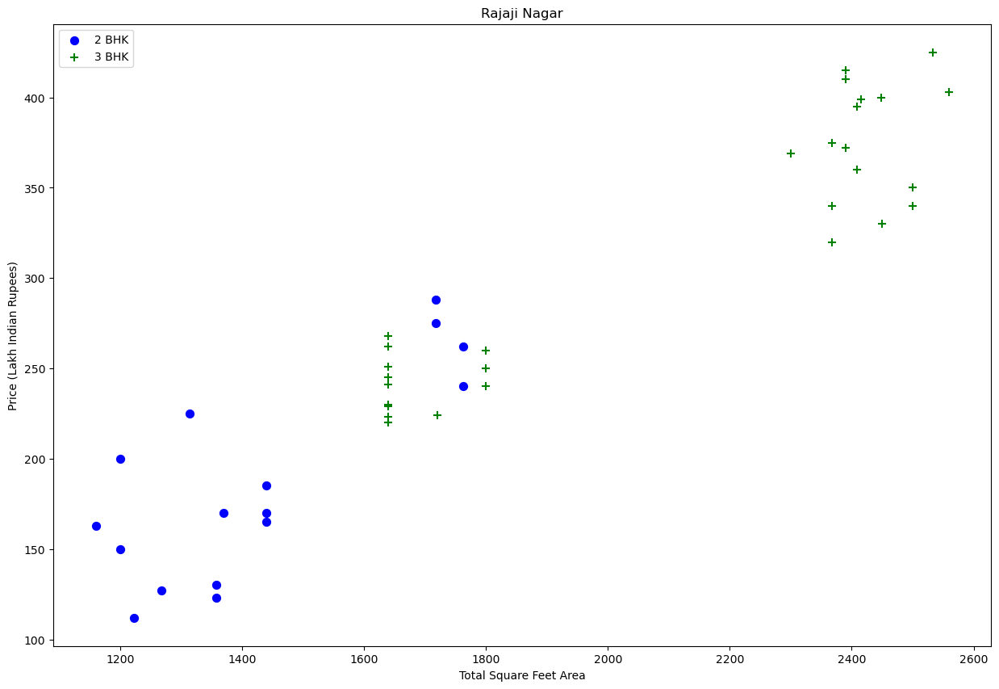

In [67]:
plot_scatter_chart(df6,"Rajaji Nagar")

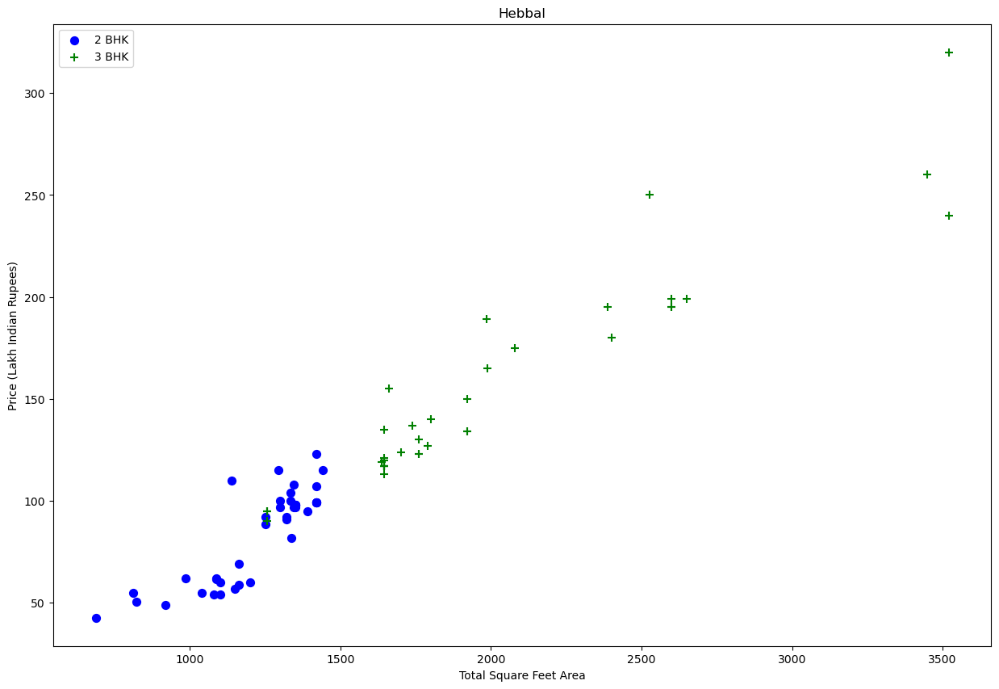

In [68]:
plot_scatter_chart(df6,"Hebbal")

Text(0, 0.5, 'Count')

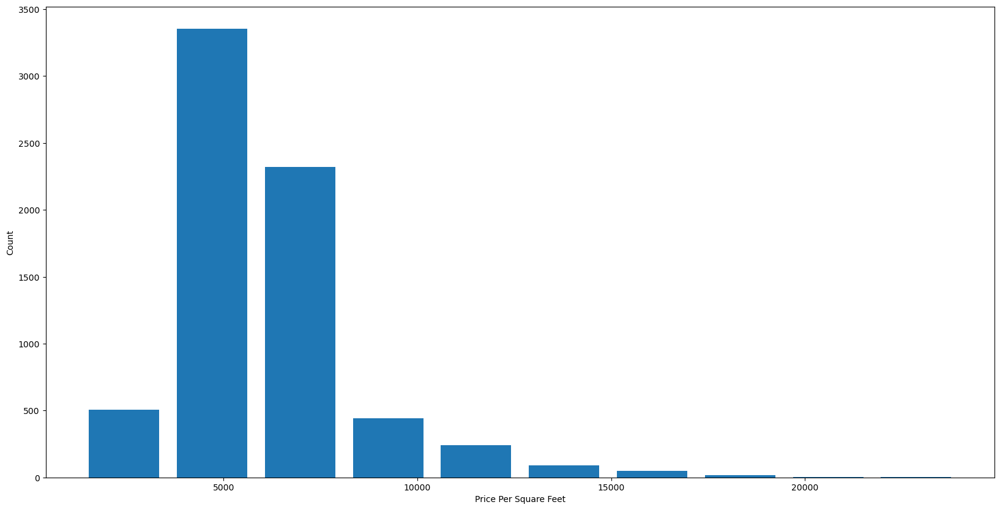

In [69]:
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(df6.price_per_sqft,rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

In [70]:
df6

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,1st Block Jayanagar,4 BHK,2850.0,4.0,1.0,428.0,3,4,15017.543860
1,1st Block Jayanagar,3 BHK,1630.0,3.0,2.0,194.0,3,3,11901.840491
2,1st Block Jayanagar,3 BHK,1875.0,2.0,3.0,235.0,3,3,12533.333333
3,1st Block Jayanagar,3 BHK,1200.0,2.0,0.0,130.0,0,3,10833.333333
4,1st Block Jayanagar,2 BHK,1235.0,2.0,2.0,148.0,3,2,11983.805668
...,...,...,...,...,...,...,...,...,...
9838,other,2 BHK,1155.0,2.0,1.0,64.0,3,2,5541.125541
9840,other,2 BHK,1200.0,2.0,3.0,70.0,1,2,5833.333333
9841,other,1 BHK,1800.0,1.0,1.0,200.0,3,1,11111.111111
9844,other,2 BHK,1353.0,2.0,2.0,110.0,3,2,8130.081301


In [71]:
df6.bath.unique()

array([ 4.,  3.,  2.,  8.,  1.,  5.,  6.,  7.,  9., 13.])

Text(0, 0.5, 'Count')

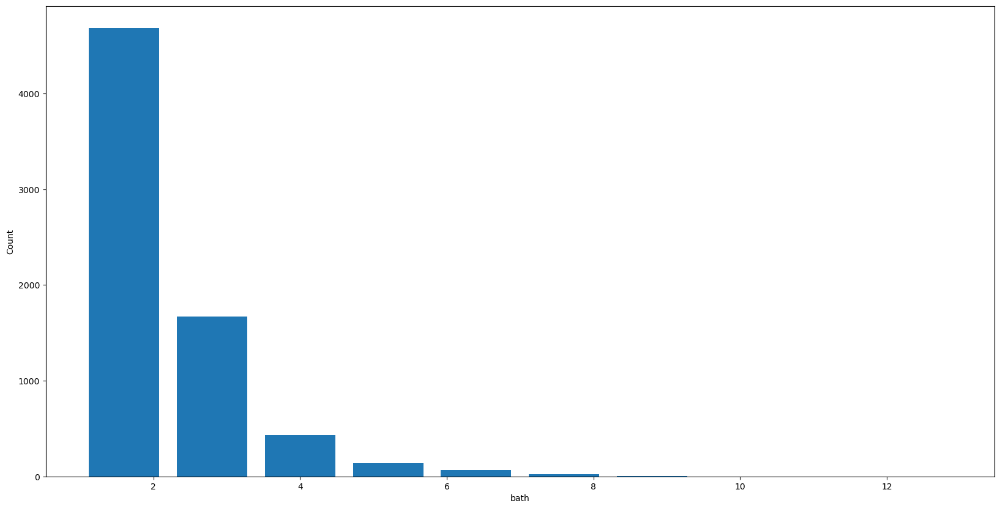

In [72]:
plt.hist(df6.bath,rwidth=0.8)
plt.xlabel("bath")
plt.ylabel("Count")

**Bath more than bedrooms**

In [73]:
df6[df6.bath>6]

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
33,2nd Stage Nagarbhavi,6 Bedroom,3000.0,8.0,3.0,451.0,2,6,15033.333333
34,2nd Stage Nagarbhavi,6 Bedroom,2400.0,8.0,3.0,450.0,2,6,18750.000000
279,Abbigere,8 Bedroom,3000.0,8.0,0.0,150.0,0,8,5000.000000
1219,Bommanahalli,8 Bedroom,3000.0,8.0,0.0,140.0,0,8,4666.666667
1542,Chikkabanavar,4 Bedroom,2460.0,7.0,2.0,80.0,0,4,3252.032520
1547,Chikkabanavar,8 Bedroom,4000.0,7.0,0.0,110.0,0,8,2750.000000
2799,Hegde Nagar,6 Bedroom,3000.0,7.0,2.0,210.0,0,6,7000.000000
3088,Horamavu Banaswadi,6 Bedroom,3800.0,8.0,0.0,200.0,0,6,5263.157895
3352,Indira Nagar,8 Bedroom,3250.0,8.0,1.0,600.0,2,8,18461.538462
3599,KR Puram,9 BHK,4600.0,9.0,2.0,200.0,0,9,4347.826087


In [74]:
df6[df6.bath>df6.bhk+2]

,location,size,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
1542,Chikkabanavar,4 Bedroom,2460.0,7.0,2.0,80.0,0,4,3252.032520
6450,Thanisandra,3 BHK,1806.0,6.0,2.0,116.0,3,3,6423.034330
8091,other,6 BHK,11338.0,9.0,1.0,1000.0,3,6,8819.897689


In [75]:
df7=df6[df6.bath<df6.bhk+2]
df7.shape

(6958, 9)

In [76]:
df7 = df6.drop(['size'],axis='columns')

In [77]:
df7.head()

,location,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft
0,1st Block Jayanagar,2850.0,4.0,1.0,428.0,3,4,15017.543860
1,1st Block Jayanagar,1630.0,3.0,2.0,194.0,3,3,11901.840491
2,1st Block Jayanagar,1875.0,2.0,3.0,235.0,3,3,12533.333333
3,1st Block Jayanagar,1200.0,2.0,0.0,130.0,0,3,10833.333333
4,1st Block Jayanagar,1235.0,2.0,2.0,148.0,3,2,11983.805668


In [78]:
df7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7025 entries, 0 to 9845
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   location          7025 non-null   object 
 1   total_sqft        7025 non-null   float64
 2   bath              7025 non-null   float64
 3   balcony           7025 non-null   float64
 4   price             7025 non-null   float64
 5   area_typeEncoded  7025 non-null   int32  
 6   bhk               7025 non-null   int64  
 7   price_per_sqft    7025 non-null   float64
dtypes: float64(5), int32(1), int64(1), object(1)
memory usage: 466.5+ KB


## Encoding - one hot encoding

In [79]:
dummies = pd.get_dummies(df7.location)
dummies.head()

,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Phase JP Nagar,6th Phase JP Nagar,7th Phase JP Nagar,8th Phase JP Nagar,9th Phase JP Nagar,AECS Layout,...,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur,other
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [80]:
df8 = pd.concat([df7,dummies.drop('other',axis='columns')],axis='columns')
df8.head()

,location,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft,1st Block Jayanagar,1st Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,1st Block Jayanagar,2850.0,4.0,1.0,428.0,3,4,15017.543860,1,0,...,0,0,0,0,0,0,0,0,0,0
1,1st Block Jayanagar,1630.0,3.0,2.0,194.0,3,3,11901.840491,1,0,...,0,0,0,0,0,0,0,0,0,0
2,1st Block Jayanagar,1875.0,2.0,3.0,235.0,3,3,12533.333333,1,0,...,0,0,0,0,0,0,0,0,0,0
3,1st Block Jayanagar,1200.0,2.0,0.0,130.0,0,3,10833.333333,1,0,...,0,0,0,0,0,0,0,0,0,0
4,1st Block Jayanagar,1235.0,2.0,2.0,148.0,3,2,11983.805668,1,0,...,0,0,0,0,0,0,0,0,0,0


In [81]:
df9 = df8.drop('location',axis='columns')
df9.head()

,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,1.0,428.0,3,4,15017.543860,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,2.0,194.0,3,3,11901.840491,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3.0,235.0,3,3,12533.333333,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,0.0,130.0,0,3,10833.333333,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2.0,148.0,3,2,11983.805668,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [82]:
df9.shape

(7025, 244)

In [83]:
##correlation
df_corr = df9.copy()

In [84]:
df_corr.corr()

,total_sqft,bath,balcony,price,area_typeEncoded,bhk,price_per_sqft,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
total_sqft,1.000000,0.751509,0.264871,0.831948,-0.063005,0.714781,0.389441,0.023447,0.004618,-0.007123,...,-0.005394,0.004609,-0.019649,-0.015022,0.108125,-0.006062,0.002730,-0.038403,-0.007880,-0.016715
bath,0.751509,1.000000,0.274449,0.618801,-0.069309,0.873153,0.357223,0.019774,0.004394,-0.010045,...,0.005160,0.020214,-0.010250,-0.028589,0.073667,-0.017006,0.002750,-0.045743,-0.008800,-0.019378
balcony,0.264871,0.274449,1.000000,0.204364,0.093931,0.268596,0.093898,-0.004717,0.005441,0.008688,...,-0.027672,-0.031727,0.021240,-0.043324,0.016310,0.022715,0.019638,-0.012713,0.023823,-0.006805
price,0.831948,0.618801,0.204364,1.000000,-0.047418,0.574509,0.734682,0.066795,0.020787,-0.018563,...,0.001264,-0.005805,-0.017241,-0.021041,0.069296,-0.007674,-0.012998,-0.029281,-0.016632,-0.002858
area_typeEncoded,-0.063005,-0.069309,0.093931,-0.047418,1.000000,-0.094515,-0.047863,0.005508,0.005017,0.018478,...,0.008194,-0.000677,0.013063,0.036435,0.010352,0.012276,0.004615,-0.023141,0.005508,0.023475
bhk,0.714781,0.873153,0.268596,0.574509,-0.094515,1.000000,0.341411,0.030086,-0.005299,0.006430,...,-0.000865,0.028773,-0.012664,-0.035323,0.053569,-0.004399,-0.003814,-0.047950,-0.011552,-0.027934
price_per_sqft,0.389441,0.357223,0.093898,0.734682,-0.047863,0.341411,1.000000,0.097489,0.046759,-0.034150,...,0.018822,-0.015667,-0.021979,-0.022493,0.037364,-0.007457,-0.016926,-0.033128,-0.029072,0.022797
1st Block Jayanagar,0.023447,0.019774,-0.004717,0.066795,0.005508,0.030086,0.097489,1.000000,-0.001411,-0.001066,...,-0.002033,-0.000653,-0.000754,-0.002103,-0.005837,-0.001251,-0.003516,-0.001849,-0.000997,-0.002329
1st Phase JP Nagar,0.004618,0.004394,0.005441,0.020787,0.005017,-0.005299,0.046759,-0.001411,1.000000,-0.001509,...,-0.002877,-0.000924,-0.001067,-0.002975,-0.008258,-0.001770,-0.004975,-0.002616,-0.001411,-0.003295
2nd Phase Judicial Layout,-0.007123,-0.010045,0.008688,-0.018563,0.018478,0.006430,-0.034150,-0.001066,-0.001509,1.000000,...,-0.002174,-0.000698,-0.000806,-0.002248,-0.006240,-0.001337,-0.003759,-0.001977,-0.001066,-0.002490


In [85]:
import seaborn as sns
##sns.pairplot(df_corr)

## reg plot

Text(0, 0.5, 'Price')

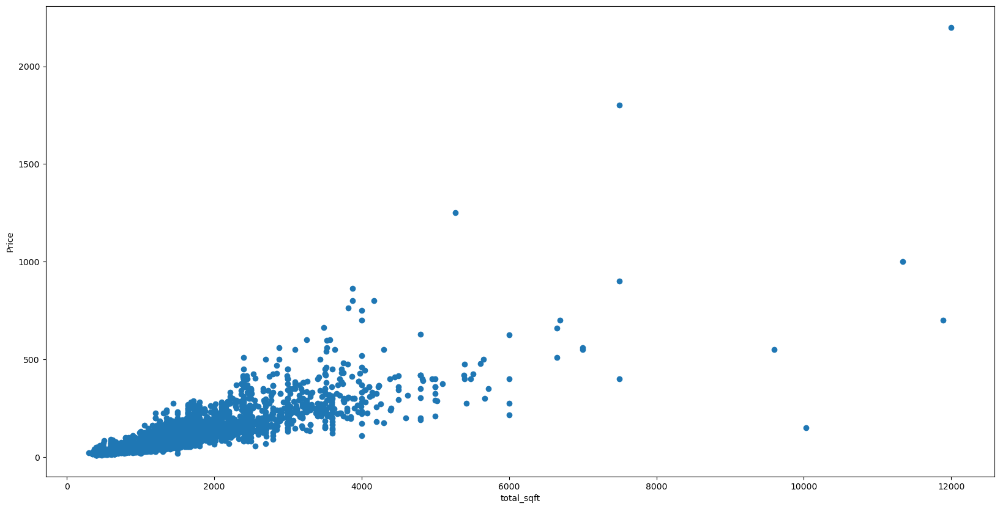

In [86]:
plt.scatter(df_corr['total_sqft'],df_corr['price'])
plt.xlabel("total_sqft")
plt.ylabel("Price")

<AxesSubplot:xlabel='total_sqft', ylabel='price'>

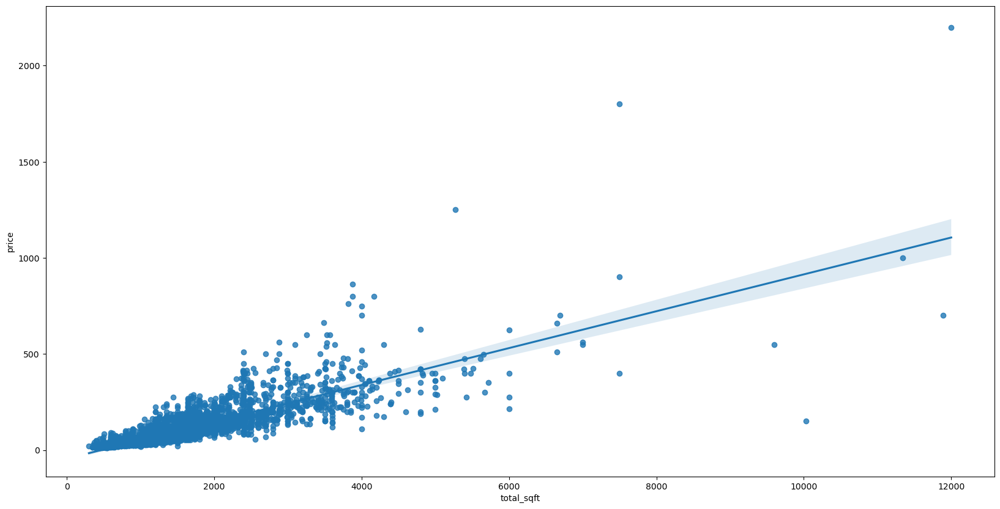

In [87]:
sns.regplot(x="total_sqft",y="price",data=df_corr)

<AxesSubplot:xlabel='bhk', ylabel='price'>

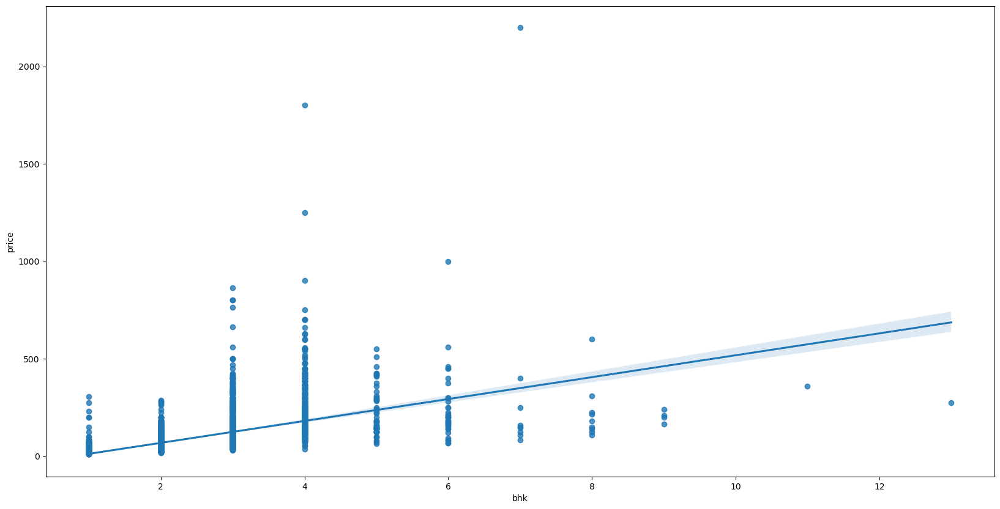

In [88]:
sns.regplot(x="bhk",y="price",data=df_corr)

<AxesSubplot:xlabel='price_per_sqft', ylabel='price'>

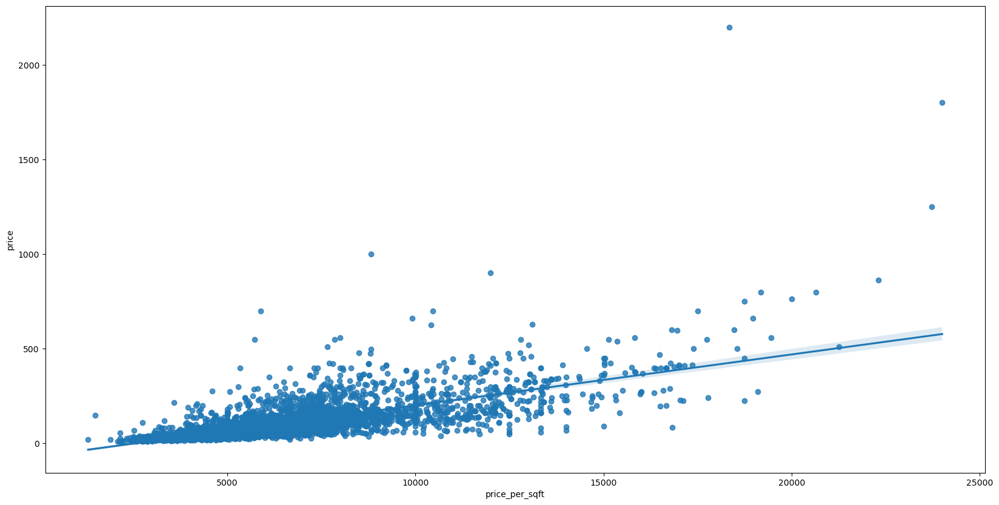

In [89]:
sns.regplot(x="price_per_sqft",y="price",data=df_corr)

In [90]:
X1 = df9.drop(['price_per_sqft'],axis='columns')
X1.head()

,total_sqft,bath,balcony,price,area_typeEncoded,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,1.0,428.0,3,4,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,2.0,194.0,3,3,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3.0,235.0,3,3,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,0.0,130.0,0,3,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2.0,148.0,3,2,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [91]:
X = X1.drop(['price'],axis='columns')

In [92]:
X.head()

,total_sqft,bath,balcony,area_typeEncoded,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,1.0,3,4,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,2.0,3,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3.0,3,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,0.0,0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2.0,3,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [93]:
y = df9.price
y.head()

0    428.0
1    194.0
2    235.0
3    130.0
4    148.0
Name: price, dtype: float64

In [94]:
len(y)

7025

In [95]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [96]:
X_train.shape

(5620, 242)

In [97]:
X_test.shape

(1405, 242)

In [98]:
y_train.shape

(5620,)

In [99]:
y_test.shape

(1405,)

## pearson correlation

In [100]:
""" import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show() """

' import seaborn as sns\n#Using Pearson Correlation\nplt.figure(figsize=(12,10))\ncor = X.corr()\nsns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)\nplt.show() '

In [101]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [102]:
corrr_feature = correlation(X,0.85)
len(set(corrr_feature))

1

In [103]:
corrr_feature

{'bhk'}

In [104]:
X_train=X_train.drop(corrr_feature,axis=1)
X_train

,total_sqft,bath,balcony,area_typeEncoded,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Phase JP Nagar,6th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
8576,1800.0,3.0,0.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2258,1305.0,2.0,1.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5737,950.0,2.0,2.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8169,4051.0,4.0,3.0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3817,1080.0,2.0,1.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1414,650.0,1.0,1.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4275,1026.0,2.0,1.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1619,3489.0,3.0,1.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5684,1500.0,3.0,2.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [105]:
X_test=X_test.drop(corrr_feature,axis=1)
X_test

,total_sqft,bath,balcony,area_typeEncoded,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Phase JP Nagar,6th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
483,950.0,2.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1868,1350.0,3.0,2.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8247,1200.0,4.0,3.0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3381,1690.0,3.0,2.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
311,1412.0,2.0,3.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3084,1460.0,2.0,1.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8933,600.0,1.0,0.0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2611,1152.0,2.0,2.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2000,890.0,2.0,1.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Model feed

In [106]:
from sklearn.linear_model import LinearRegression
mod_pred = LinearRegression()
mod_pred.fit(X_train,y_train)
mod_pred.score(X_test,y_test)

0.7956132013694182

## K-cross validation - shuffling

In [107]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.7641224 , 0.8549738 , 0.86934515, 0.82016739, 0.87913935])

**In 5 iterations we get a score above 79% all the time. This is pretty good but we want to test few other algorithms for regression to see if we can get even better score. We will use GridSearchCV for this**

## GridSearchCV

In [108]:
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'linear_regression' : {
            'model': LinearRegression(),
            'params': {
                'normalize': [True, False]
            }
        },
        'lasso': {
            'model': Lasso(),
            'params': {
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        'decision_tree': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion' : ['mse','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

find_best_model_using_gridsearchcv(X,y)

c:\Users\richardgr\Anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
c:\Users\richardgr\Anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline


,model,best_score,best_params
0,linear_regression,0.837550,{'normalize': False}
1,lasso,0.690087,"{'alpha': 1, 'selection': 'random'}"
2,decision_tree,0.715982,"{'criterion': 'mse', 'splitter': 'random'}"


## Test the model

In [109]:
X.columns

Index(['total_sqft', 'bath', 'balcony', 'area_typeEncoded', 'bhk',
       '1st Block Jayanagar', '1st Phase JP Nagar',
       '2nd Phase Judicial Layout', '2nd Stage Nagarbhavi',
       '5th Phase JP Nagar',
       ...
       'Vijayanagar', 'Vishveshwarya Layout', 'Vishwapriya Layout',
       'Vittasandra', 'Whitefield', 'Yelachenahalli', 'Yelahanka',
       'Yelahanka New Town', 'Yelenahalli', 'Yeshwanthpur'],
      dtype='object', length=242)

In [110]:
## to remove 'bhk' to fit following code having X as factor on finding column 
X=X.drop(['bhk'], axis=1)

In [111]:
X.head(5)

,total_sqft,bath,balcony,area_typeEncoded,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Phase JP Nagar,6th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,1.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,2.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,0.0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [112]:
np.where(X.columns=="5th Phase JP Nagar")[0][0]

8

In [113]:
## print to debug things fill val & rest all zeros
## check this out to get understanding

def predict_price(location,sqft,bath,area_typeEncoded,balcony):    
    loc_index = np.where(X.columns==location)[0][0]
    x = np.zeros(len(X.columns))
    print(len(X.columns))
    print(x)
    x[0] = sqft
    x[1] = bath
    x[2] = area_typeEncoded
    x[3] = balcony
    print(x)
    print(loc_index)
    if loc_index >= 0:
        x[loc_index] = 1
    print(x)
    return mod_pred.predict([x])[0]

predict_price('1st Phase JP Nagar',1000, 2, 3, 2)


241
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]
[1000.    2.    3.    2.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.

c:\Users\richardgr\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


89.03736400695632

In [114]:
predict_price('Vijayanagar',1500, 3, 2,3)

241
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]
[1500.    3.    2.    3.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
    0.    0.    0.    0.    0.    0.    0.

c:\Users\richardgr\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


104.37663912167562

## Export the tested model to a pickle file

In [115]:
import pickle
with open('banglore_home.pickle','wb') as f:
    pickle.dump(mod_pred,f)

In [116]:
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("Alpha_converter.json","w") as f:
    f.write(json.dumps(columns))

In [117]:

columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
print(type(columns))

<class 'dict'>


## PCA [using 95% of useful comp]

In [118]:
from sklearn.decomposition import PCA

pca = PCA(0.95)
X_pca = pca.fit_transform(X)
X_pca.shape

(7025, 1)

In [119]:
X_pca

array([[1397.26781665],
       [ 177.2677617 ],
       [ 422.26695182],
       ...,
       [ 347.26545156],
       [ -99.73306495],
       [-640.73422557]])

In [120]:
pca.explained_variance_ratio_

array([0.99999422])

In [121]:
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.2, random_state=30)

In [122]:
from sklearn.linear_model import LinearRegression
mod_new = LinearRegression()
mod_new.fit(X_train_pca,y_train_pca)
mod_new.score(X_test_pca,y_test_pca)

0.697279231449611

In [123]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

# Example data
house_sizes = np.array([1000, 1500, 1200, 1800, 1350])
house_prices = np.array([250000, 350000, 300000, 400000, 320000])

# Create and train the linear regression model
regression_model = LinearRegression()
regression_model.fit(house_sizes.reshape(-1, 1), house_prices)
##to debug -> print(house_sizes.reshape(-1, 1), house_prices)

# Predict the house prices
predicted_prices = regression_model.predict(house_sizes.reshape(-1, 1))

# Calculate R-squared
r2 = r2_score(house_prices, predicted_prices)
percentage_accuracy_r2 = r2 * 100

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(house_prices, predicted_prices)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(house_prices, predicted_prices)

# Print the results
print("R-squared:", percentage_accuracy_r2)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape * 100)

R-squared: 99.18391443256009
MSE: 20434782.608695578
RMSE: 4520.4847758504375
MAPE: 1.2554477225672853
